In [11]:
from cellpose import io, models, train
from tqdm import tqdm
import numpy as np

#Change to the actual path
train_dir = "D:/BIAGroup_ica/cell_pose_data/train_data"  
test_dir = "D:/BIAGroup_ica/cell_pose_data/test_data"    

output = io.load_train_test_data(
    train_dir=train_dir,
    test_dir=test_dir,
    image_filter="",        
    mask_filter="_masks",   
    look_one_level_down=False
)

images, labels, image_names, test_images, test_labels, image_names_test = output


In [2]:
#train model
train_min = min([img.min() for img in images])
train_max = max([img.max() for img in images])
test_min = min([img.min() for img in test_images])
test_max = max([img.max() for img in test_images])
print(f"Training data range: min={train_min}, max={train_max}")
print(f"Test data range: min={test_min}, max={test_max}")

if train_max > 1 or test_max > 1:
    images = [img / 255.0 for img in images]
    test_images = [img / 255.0 for img in test_images]
    print("Data normalized to [0, 1] range.")

model = models.CellposeModel(model_type="cyto3", gpu=True)

n_epochs = 100
patience = 10
min_delta = 0.01
best_loss = np.inf
patience_counter = 0

train_losses = []
test_losses = []

for epoch in tqdm(range(n_epochs), desc="Training Progress"):
    model_path, train_loss, test_loss = train.train_seg(
        model.net,
        train_data=images,
        train_labels=labels,
        channels=[2, 1],
        normalize=True,
        test_data=test_images,
        test_labels=test_labels,
        weight_decay=1e-4,
        SGD=True,
        learning_rate=0.1,  
        n_epochs=1,
        model_name="my_retrained_model2"
    )
    
    train_loss_value = train_loss.mean() if isinstance(train_loss, np.ndarray) else train_loss
    test_loss_value = test_loss.mean() if isinstance(test_loss, np.ndarray) else test_loss

    train_losses.append(train_loss_value)
    test_losses.append(test_loss_value)

    print(f"Epoch {epoch + 1}/{n_epochs}, Train Loss: {train_loss_value:.4f}, Test Loss: {test_loss_value:.4f}")

    if test_loss_value < best_loss - min_delta:
        best_loss = test_loss_value
        patience_counter = 0
        print(f"Validation loss improved to {best_loss:.4f}, saving model...")
    else:
        patience_counter += 1
        print(f"No improvement. Patience counter: {patience_counter}/{patience}")
    
    if patience_counter >= patience:
        print("Early stopping triggered!")
        break

print("Training complete! The model is stored in:", model_path)


Training data range: min=0, max=255
Test data range: min=0, max=255
Data normalized to [0, 1] range.


D:\PyhtonEnvironment\Python39\lib\site-packages\torch\cuda\__init__.py:138: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\c10\cuda\CUDAFunctions.cpp:108.)
  return torch._C._cuda_getDeviceCount() > 0
100%|██████████| 60/60 [00:12<00:00,  4.75it/s]

100%|██████████| 32/32 [00:06<00:00,  4.69it/s]

100%|██████████| 60/60 [00:00<00:00, 198.44it/s]

Training Progress:   1%|          | 1/100 [01:14<2:02:07, 74.02s/it]

Epoch 1/100, Train Loss: 0.4652, Test Loss: 0.3864
Validation loss improved to 0.3864, saving model...



100%|██████████| 60/60 [00:11<00:00,  5.06it/s]

100%|██████████| 32/32 [00:05<00:00,  5.54it/s]

100%|██████████| 60/60 [00:00<00:00, 283.34it/s]

Training Progress:   2%|▏         | 2/100 [02:20<1:53:43, 69.62s/it]

Epoch 2/100, Train Loss: 0.4652, Test Loss: 0.3727
Validation loss improved to 0.3727, saving model...



100%|██████████| 60/60 [00:11<00:00,  5.02it/s]

100%|██████████| 32/32 [00:05<00:00,  5.53it/s]

100%|██████████| 60/60 [00:00<00:00, 303.96it/s]

Training Progress:   3%|▎         | 3/100 [03:25<1:48:50, 67.32s/it]

Epoch 3/100, Train Loss: 0.4652, Test Loss: 0.3692
No improvement. Patience counter: 1/10



100%|██████████| 60/60 [00:11<00:00,  5.07it/s]

100%|██████████| 32/32 [00:05<00:00,  5.53it/s]

100%|██████████| 60/60 [00:00<00:00, 296.96it/s]

Training Progress:   4%|▍         | 4/100 [04:28<1:45:07, 65.70s/it]

Epoch 4/100, Train Loss: 0.4652, Test Loss: 0.3735
No improvement. Patience counter: 2/10



100%|██████████| 60/60 [00:12<00:00,  4.99it/s]

100%|██████████| 32/32 [00:05<00:00,  5.50it/s]

100%|██████████| 60/60 [00:00<00:00, 304.50it/s]

Training Progress:   5%|▌         | 5/100 [05:32<1:43:19, 65.26s/it]

Epoch 5/100, Train Loss: 0.4652, Test Loss: 0.3811
No improvement. Patience counter: 3/10



100%|██████████| 60/60 [00:11<00:00,  5.00it/s]

100%|██████████| 32/32 [00:06<00:00,  5.16it/s]

100%|██████████| 60/60 [00:00<00:00, 251.27it/s]

Training Progress:   6%|▌         | 6/100 [06:38<1:42:17, 65.29s/it]

Epoch 6/100, Train Loss: 0.4652, Test Loss: 0.3884
No improvement. Patience counter: 4/10



100%|██████████| 60/60 [00:12<00:00,  4.66it/s]

100%|██████████| 32/32 [00:06<00:00,  5.00it/s]

100%|██████████| 60/60 [00:00<00:00, 257.76it/s]

Training Progress:   7%|▋         | 7/100 [07:45<1:42:25, 66.08s/it]

Epoch 7/100, Train Loss: 0.4652, Test Loss: 0.3942
No improvement. Patience counter: 5/10



100%|██████████| 60/60 [00:12<00:00,  4.81it/s]

100%|██████████| 32/32 [00:05<00:00,  5.37it/s]

100%|██████████| 60/60 [00:00<00:00, 307.76it/s]

Training Progress:   8%|▊         | 8/100 [08:48<1:39:31, 64.91s/it]

Epoch 8/100, Train Loss: 0.4652, Test Loss: 0.3991
No improvement. Patience counter: 6/10



100%|██████████| 60/60 [00:12<00:00,  4.67it/s]

100%|██████████| 32/32 [00:06<00:00,  5.06it/s]

100%|██████████| 60/60 [00:00<00:00, 307.78it/s]

Training Progress:   9%|▉         | 9/100 [09:52<1:38:09, 64.72s/it]

Epoch 9/100, Train Loss: 0.4652, Test Loss: 0.4028
No improvement. Patience counter: 7/10



100%|██████████| 60/60 [00:12<00:00,  4.72it/s]

100%|██████████| 32/32 [00:06<00:00,  5.19it/s]

100%|██████████| 60/60 [00:00<00:00, 312.43it/s]

Training Progress:  10%|█         | 10/100 [10:57<1:36:59, 64.66s/it]

Epoch 10/100, Train Loss: 0.4652, Test Loss: 0.4056
No improvement. Patience counter: 8/10



100%|██████████| 60/60 [00:14<00:00,  4.13it/s]

100%|██████████| 32/32 [00:06<00:00,  5.03it/s]

100%|██████████| 60/60 [00:00<00:00, 306.42it/s]

Training Progress:  11%|█         | 11/100 [12:05<1:37:22, 65.65s/it]

Epoch 11/100, Train Loss: 0.4652, Test Loss: 0.4076
No improvement. Patience counter: 9/10



100%|██████████| 60/60 [00:13<00:00,  4.52it/s]

100%|██████████| 32/32 [00:06<00:00,  5.07it/s]

100%|██████████| 60/60 [00:00<00:00, 295.49it/s]

Training Progress:  11%|█         | 11/100 [13:09<1:46:23, 71.73s/it]

Epoch 12/100, Train Loss: 0.4652, Test Loss: 0.4090
No improvement. Patience counter: 10/10
Early stopping triggered!
训练完成！模型保存在: D:\BIAGroup_ica\models\my_retrained_model2


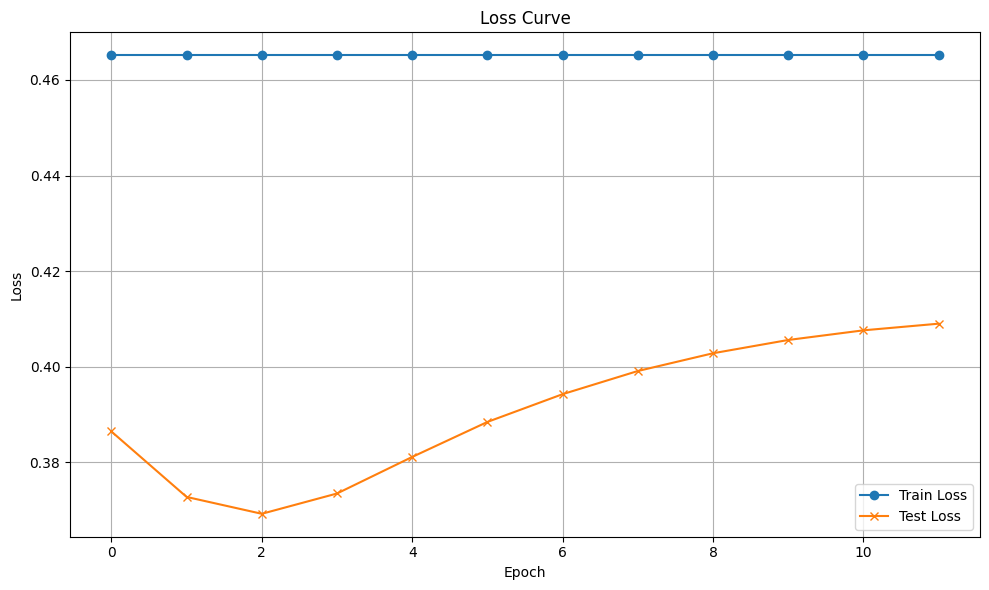

In [4]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label="Train Loss", marker='o')
plt.plot(test_losses, label="Test Loss", marker='x')
plt.title("Loss Curve")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_curve.png")  
plt.show()

In [7]:
from cellpose import models

model = models.CellposeModel(pretrained_model="D:/BIAGroup_ica/models/my_retrained_model2", gpu=True)


C:\Users\xzy\AppData\Local\Temp\ipykernel_24152\538003616.py:71: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  imsave(tif_output_file, masks[0].astype(np.uint16))  # 保存为 TIFF 格式


Saved segmentation result for image t000.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t000_segmentation.png
Saved mask for image t000.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t000_mask.tif
Saved outline for image t000.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t000_outline.txt
Saved segmentation result for image t001.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t001_segmentation.png
Saved mask for image t001.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t001_mask.tif
Saved outline for image t001.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t001_outline.txt
Saved segmentation result for image t002.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t002_segmentation.png
Saved mask for image t002.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t002_mask.tif
Saved outline for image t002.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t002_outline.txt
Saved segmentation result for image t003.jpg to D:/BIAGrou

C:\Users\xzy\AppData\Local\Temp\ipykernel_24152\538003616.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(8, 8))


Saved segmentation result for image t020.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t020_segmentation.png
Saved mask for image t020.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t020_mask.tif
Saved outline for image t020.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t020_outline.txt
Saved segmentation result for image t021.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t021_segmentation.png
Saved mask for image t021.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t021_mask.tif
Saved outline for image t021.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t021_outline.txt
Saved segmentation result for image t022.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t022_segmentation.png
Saved mask for image t022.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t022_mask.tif
Saved outline for image t022.jpg to D:/BIAGroup_ica/cell_pose_data/GOT/img/01result\t022_outline.txt
Saved segmentation result for image t023.jpg to D:/BIAGrou

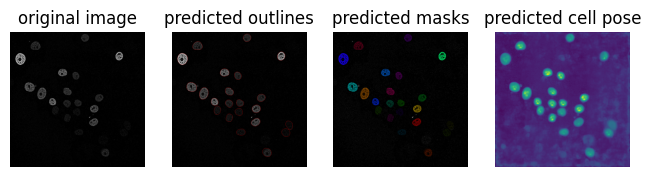

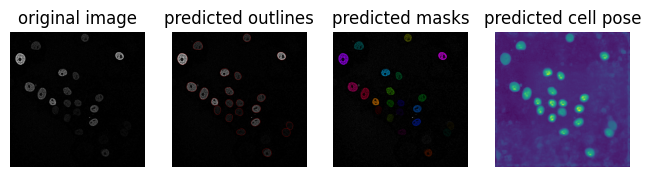

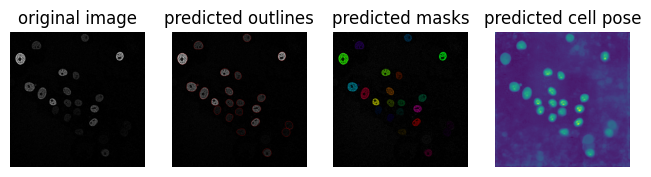

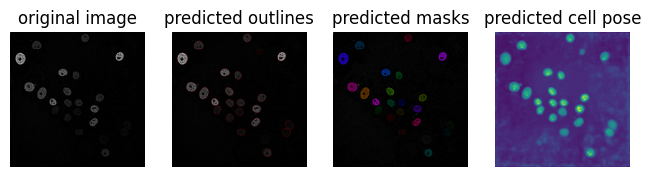

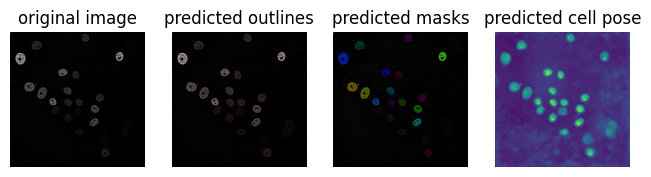

...

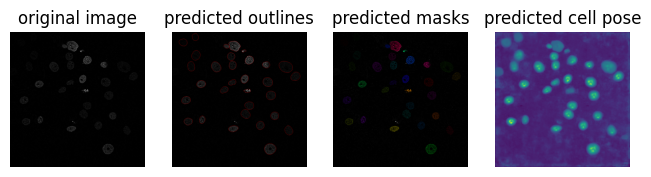

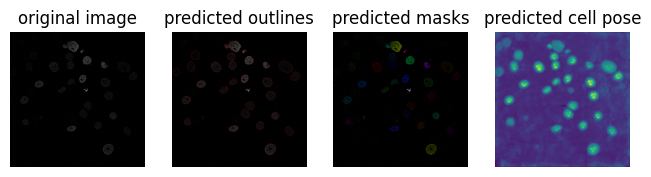

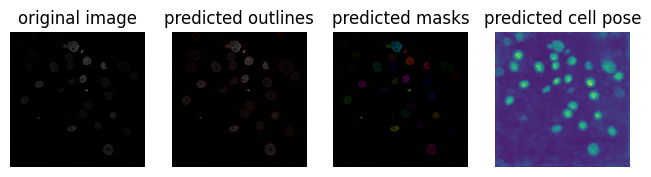

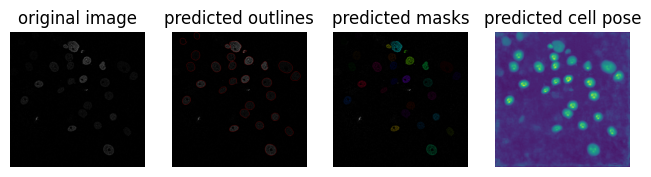

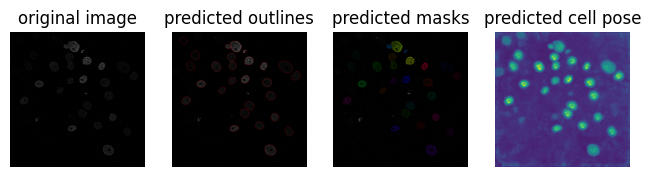

In [9]:
import os
from cellpose import io, plot
import matplotlib.pyplot as plt
import numpy as np
from tifffile import imsave
from skimage import measure  
from cellpose.io import imread

# Set up new input and output folders
input_dirs = {
    "01": {
        "input": "D:/BIAGroup_ica/cell_pose_data/GOT/img/01",
        "output": "D:/BIAGroup_ica/cell_pose_data/GOT/img/01result"
    },
    "02": {
        "input": "D:/BIAGroup_ica/cell_pose_data/GOT/img/02",
        "output": "D:/BIAGroup_ica/cell_pose_data/GOT/img/02result"
    }
}

for folder_key, paths in input_dirs.items():
    input_dir = paths["input"]
    output_dir = paths["output"]

    os.makedirs(output_dir, exist_ok=True)

    def load_images_from_folder(folder_path):
        images = []
        file_names = [] 
        for file_name in os.listdir(folder_path):
            file_path = os.path.join(folder_path, file_name)
            try:
                img = imread(file_path)  
                if img is not None:
                    images.append(img)
                    file_names.append(file_name)  
            except Exception as e:
                print(f"Failed to load image {file_name}: {e}")
        return images, file_names

    images, file_names = load_images_from_folder(input_dir)

    for i, (test_image, file_name) in enumerate(zip(images, file_names)):
        masks, flows, styles = model.eval(
            [test_image], 
            channels=[2, 1],  
            diameter=None,    
            do_3D=False       
        )

        flowi = flows[0][2]  

        fig = plt.figure(figsize=(8, 8))

        base_name = os.path.splitext(file_name)[0]

        output_file = os.path.join(output_dir, f"{base_name}_segmentation.png")
        plot.show_segmentation(fig, test_image, masks[0], flowi, channels=[2, 1], file_name=output_file)

        tif_output_file = os.path.join(output_dir, f"{base_name}_mask.tif")
        imsave(tif_output_file, masks[0].astype(np.uint16))  

        outline_file = os.path.join(output_dir, f"{base_name}_outline.txt")
        contours = measure.find_contours(masks[0], level=0.5)  
        with open(outline_file, "w") as f:
            for contour_idx, contour in enumerate(contours):
                f.write(f"Contour {contour_idx}:\n")
                np.savetxt(f, contour, fmt="%.2f")
                f.write("\n")

        print(f"Saved segmentation result for image {file_name} to {output_file}")
        print(f"Saved mask for image {file_name} to {tif_output_file}")
        print(f"Saved outline for image {file_name} to {outline_file}")

In [12]:
import numpy as np
#Calculate the intersection and union ratio
def calculate_iou(pred_mask, true_mask):

    intersection = np.logical_and(pred_mask > 0, true_mask > 0).sum()
    union = np.logical_or(pred_mask > 0, true_mask > 0).sum()
    return intersection / union if union > 0 else 0

iou_scores = []

for test_image, true_mask in zip(test_images, test_labels):
    pred_masks, _, _ = model.eval(
        [test_image], 
        channels=[2, 1], 
        diameter=None,
        do_3D=False
    )

    pred_mask = pred_masks[0]

    iou = calculate_iou(pred_mask, true_mask)
    iou_scores.append(iou)
    print(f"IoU for current image: {iou:.4f}")

mean_iou = np.mean(iou_scores)
print(f"Mean IoU for all test images: {mean_iou:.4f}")


IoU for current image: 0.8734
IoU for current image: 0.8382
IoU for current image: 0.8834
IoU for current image: 0.8854
IoU for current image: 0.8859
IoU for current image: 0.8779
IoU for current image: 0.8846
IoU for current image: 0.8826
IoU for current image: 0.8923
IoU for current image: 0.8898
IoU for current image: 0.8915
Mean IoU for all test images: 0.8805
